{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]]), 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
 

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


     mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
338       10.050         17.53           64.41      310.8          0.10070   
427       10.800         21.98           68.79      359.9          0.08801   
406       16.140         14.86          104.30      800.0          0.09495   
96        12.180         17.84           77.79      451.1          0.10450   
490       12.250         22.44           78.18      466.5          0.08192   
..           ...           ...             ...        ...              ...   
277       18.810         19.98          120.90     1102.0          0.08923   
9         12.460         24.04           83.97      475.9          0.11860   
359        9.436         18.32           59.82      278.6          0.10090   
192        9.720         18.22           60.73      288.1          0.06950   
559       11.510         23.93           74.52      403.5          0.09261   

     mean compactness  mean concavity  mean concave points  mea

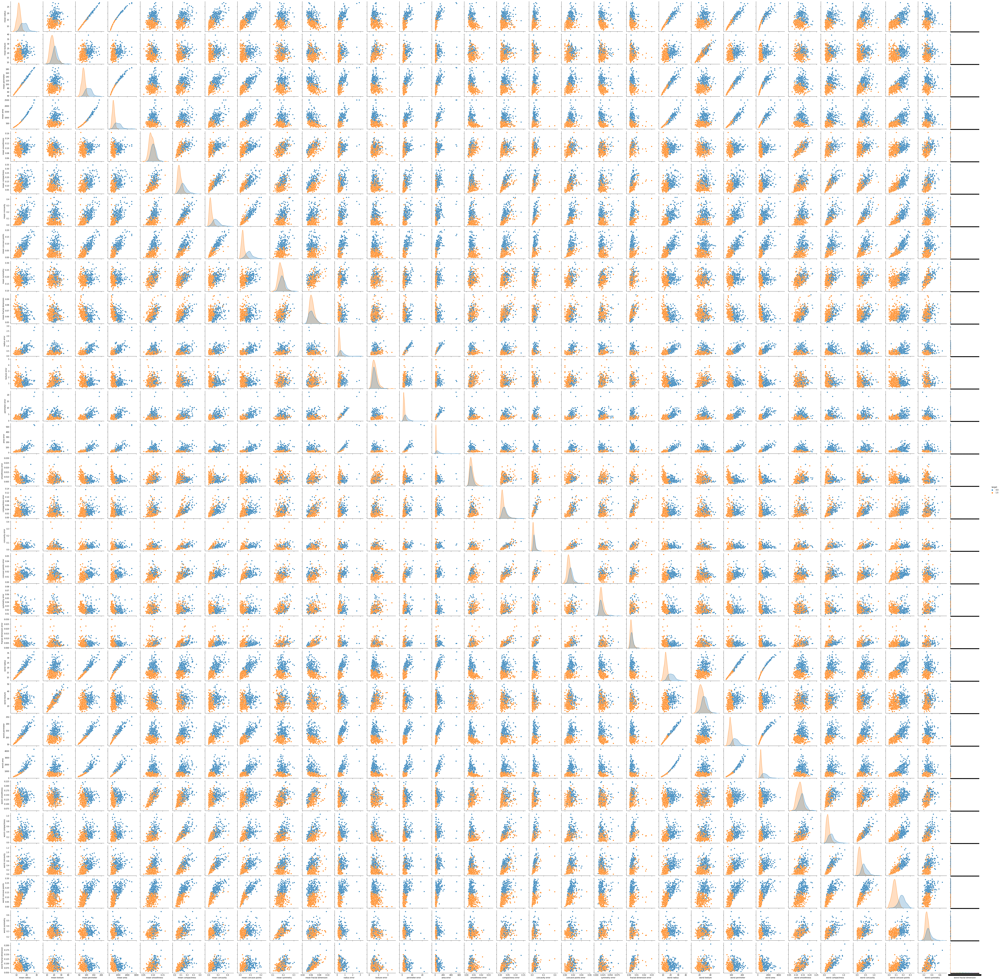

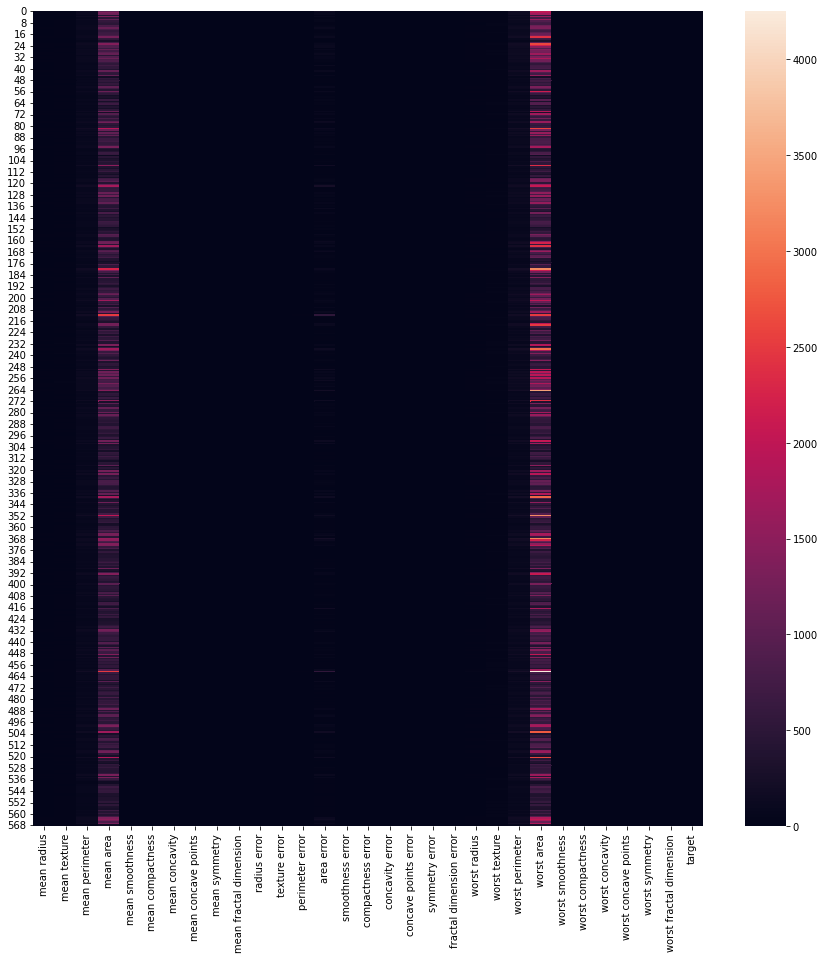

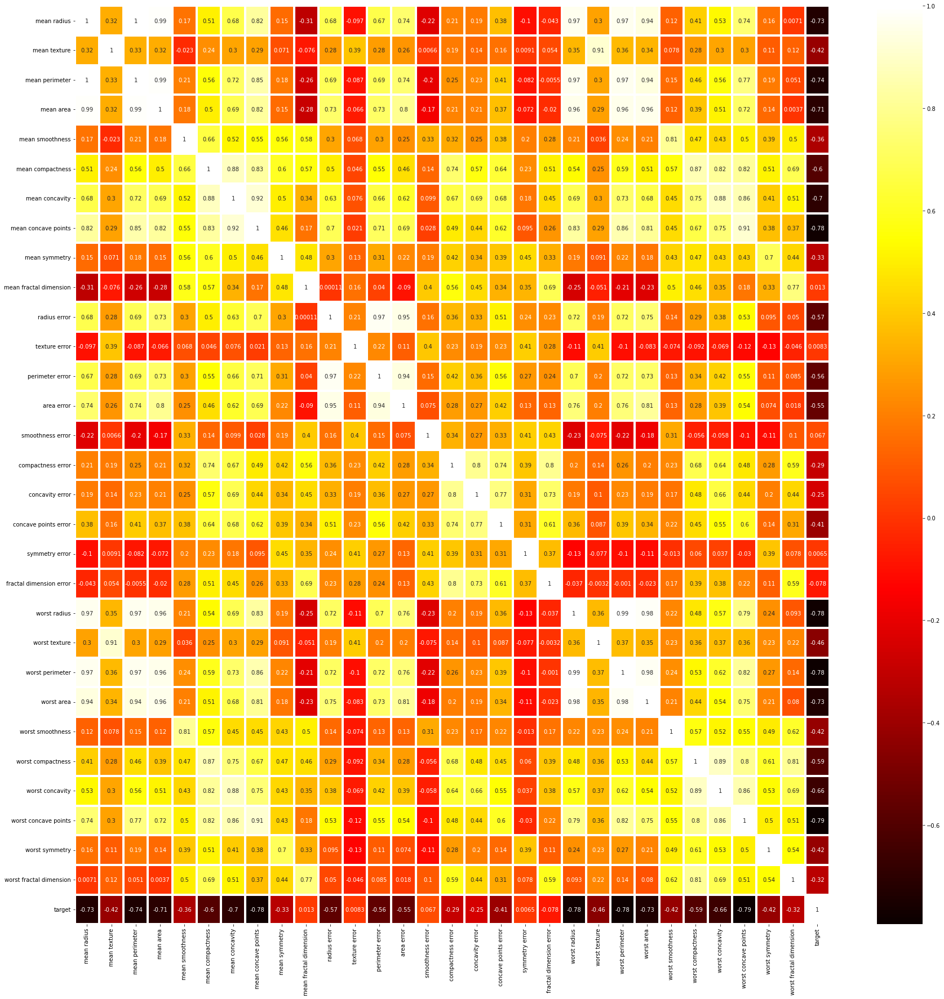

In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 

from sklearn.datasets import load_breast_cancer
cancer_dataset=load_breast_cancer()
print(cancer_dataset)
print(cancer_dataset.keys())
type(cancer_dataset) 



print(cancer_dataset["feature_names"]) 


# In[5]:


can_df=pd.DataFrame(np.c_[cancer_dataset["data"],cancer_dataset["target"]],
                   columns=np.append(cancer_dataset["feature_names"],["target"]))
can_df 


# In[6]:


can_df.to_csv("breast_cancer_dataframe.csv")
can_df.head() 


# In[ ]:





# In[9]:


can_df.info() 


# In[10]:


can_df.describe() 


# In[11]:


sns.pairplot(can_df,hue="target") 


# In[13]:


sns.countplot(can_df["target"]) 


# In[14]:


sns.countplot(can_df["mean radius"]) 


# In[12]:


plt.figure(figsize=(15,15))
sns.heatmap(can_df)  


# In[13]:


plt.figure(figsize=(30,30))
sns.heatmap(can_df.corr(),annot=True,cmap="hot",linewidths=3)  


# In[15]:


X=can_df.drop(["target"],axis=1)
y=can_df["target"]  


# In[17]:


from sklearn.model_selection import train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.20,random_state=0) 
print(X_train)
print(X_test)
print(y_train) 
print(y_test) 


# In[19]:


from sklearn.preprocessing import StandardScaler 
sc=StandardScaler() 
X_train=sc.fit_transform(X_train)
X_test=sc.fit_transform(X_test)
X_train  


# # support vector classifier 

# In[20]:


from sklearn.svm import SVC
classifier=SVC() 
classifier.fit(X_train,y_train) 


# In[21]:


y_pred=classifier.predict(X_test)
y_pred 


# In[46]:


from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test) 
print(cm)
print(accuracy_score(y_pred,y_test) )
classification_report(y_pred,y_test)


# # logistic regression 

# In[28]:


from  sklearn.linear_model import LogisticRegression 
lg_classifier=LogisticRegression(random_state=0)
lg_classifier.fit(X_train,y_train) 


# In[29]:


y_pred=lg_classifier.predict(X_test)
y_pred 


# In[33]:


from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test) 
print(cm) 
accuracy_score(y_pred,y_test) 


# # KNN classifier 

# In[34]:


from sklearn.neighbors import KNeighborsClassifier
KN_classifier=KNeighborsClassifier(n_neighbors=5,metric="minkowski",p=2) 
KN_classifier.fit(X_train,y_train) 


# In[35]:


y_pred=KN_classifier.predict(X_test)
y_pred 


# In[36]:


from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test) 
print(cm) 
accuracy_score(y_pred,y_test) 


# # Naive bayes classifier

# In[37]:


from sklearn.naive_bayes import GaussianNB 
NB_classifier=GaussianNB()
NB_classifier.fit(X_train,y_train) 


# In[38]:


y_pred=NB_classifier.predict(X_test) 
y_pred  


# In[39]:


from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test) 
print(cm) 
accuracy_score(y_pred,y_test) 


# # DEcision Tree classifier 

# In[40]:


from sklearn.tree import DecisionTreeClassifier
D_classifier=DecisionTreeClassifier(criterion="entropy",random_state=0) 
D_classifier.fit(X_train,y_train) 


# In[41]:


y_pred =D_classifier.predict(X_test)
y_pred 


# In[42]:


from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test) 
print(cm) 
accuracy_score(y_pred,y_test) 


# # random forest classifier 

# In[43]:


from sklearn.ensemble import RandomForestClassifier 
rc_classifier=RandomForestClassifier(n_estimators=20,criterion="entropy",random_state=0)
rc_classifier.fit(X_train,y_train) 


# In[44]:


y_pred=rc_classifier.predict(X_test)
y_pred 


# In[45]:


from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
cm=confusion_matrix(y_pred,y_test) 
print(cm) 
accuracy_score(y_pred,y_test) 


# In[49]:


from sklearn.model_selection import cross_val_score 
cross_validation=cross_val_score(estimator=rc_classifier,X=X_train,y=y_train) 
cross_validation
print("cross validation mean accuracy",cross_validation.mean()) 


# In[57]:


import pickle 
pickle.dump(rc_classifier,open("breast_cancer.pickle","wb"))
breast_cancer_model=pickle.load(open("breast_cancer.pickle","rb"))
y_pred=breast_cancer_model.predict(X_test)
print(confusion_matrix(y_pred,y_test))
print(accuracy_score(y_pred,y_test)) 

